In [1]:
from tokens import remove_special_characters
import numpy as np
from langchain_community.utils.math import cosine_similarity
from pathlib import Path
from translations import translate
from languages import num_languages, language_codes, language_names, non_latin_languages, language_codes_latin
from embedding_models import OpenAIEmbeddingModel, OpenAIEmbeddingModel3Small, all_embedding_models
import matplotlib.pyplot as plt
import seaborn as sns
from embeddings_tools import plot_confusion_matrices
from embeddings_tools import compute_dict_array_diff
from plots import plot_boxplot_for_matrices
from embeddings_tools import find_min_max_from_dict_matrices


source_text = Path("saturn.txt").read_text()
source_text_rephrased = Path("saturn_rephrased.txt").read_text()

def _cosine_similarity(embed_a: list[float], embed_b: list[float]) -> float:
    return cosine_similarity([embed_a], [embed_b])[0][0]


def compute_relationship_matrix(embedding_model, input_text_a: str, input_text_b: str, remove_special_chars=False, only_latin_langs=False):

    if only_latin_langs or remove_special_chars:
        lang_codes = language_codes_latin
    else:
        lang_codes = language_codes

    lang_num = len(lang_codes)

    relationship_matrix = np.zeros((lang_num, lang_num))

    for i in range(lang_num):
        for j in range(i, lang_num):

            text_lang1 = translate(input_text_a, lang_codes[i])
            text_lang2 = translate(input_text_b, lang_codes[j])

            if remove_special_chars:
                text_lang1 = remove_special_characters(text_lang1)
                text_lang2 = remove_special_characters(text_lang2)

            text_lang1_embedding = embedding_model.get_cached_embedding(text_lang1)
            text_lang2_embedding = embedding_model.get_cached_embedding(text_lang2)

            similarity = _cosine_similarity(text_lang1_embedding, text_lang2_embedding)

            relationship_matrix[i][j] = similarity

            if i != j:
                relationship_matrix[j][i] = similarity

    return relationship_matrix

same_texts = {}
rephrased_texts = {}

same_texts_only_latin = {}
same_texts_no_special_chars = {}

for model in all_embedding_models:
    print(model.NAME)
    same_texts[model.NAME] = compute_relationship_matrix(model, source_text, source_text)
    same_texts_no_special_chars[model.NAME] = compute_relationship_matrix(model, source_text, source_text, remove_special_chars=True)
    same_texts_only_latin[model.NAME] = compute_relationship_matrix(model, source_text, source_text, only_latin_langs=True)
    rephrased_texts[model.NAME] = compute_relationship_matrix(model, source_text, source_text_rephrased)


text-embedding-ada-002
text-embedding-3-small
text-embedding-3-large
textembedding-gecko-multilingual@latest
textembedding-gecko@latest
intfloat/multilingual-e5-large
intfloat/multilingual-e5-small
intfloat/e5-small-v2
intfloat/e5-small


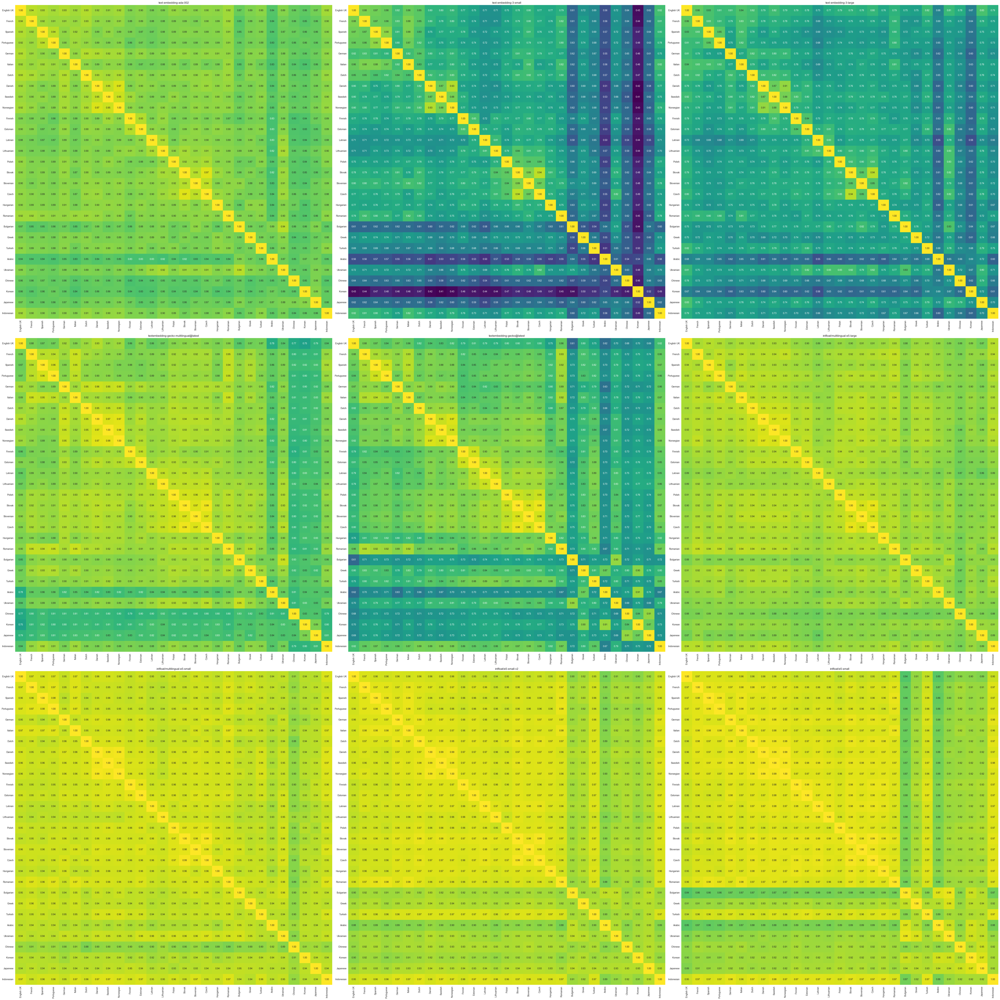

In [2]:
plot_confusion_matrices(same_texts, "plots_embeddings/similarity_same_texts.png")

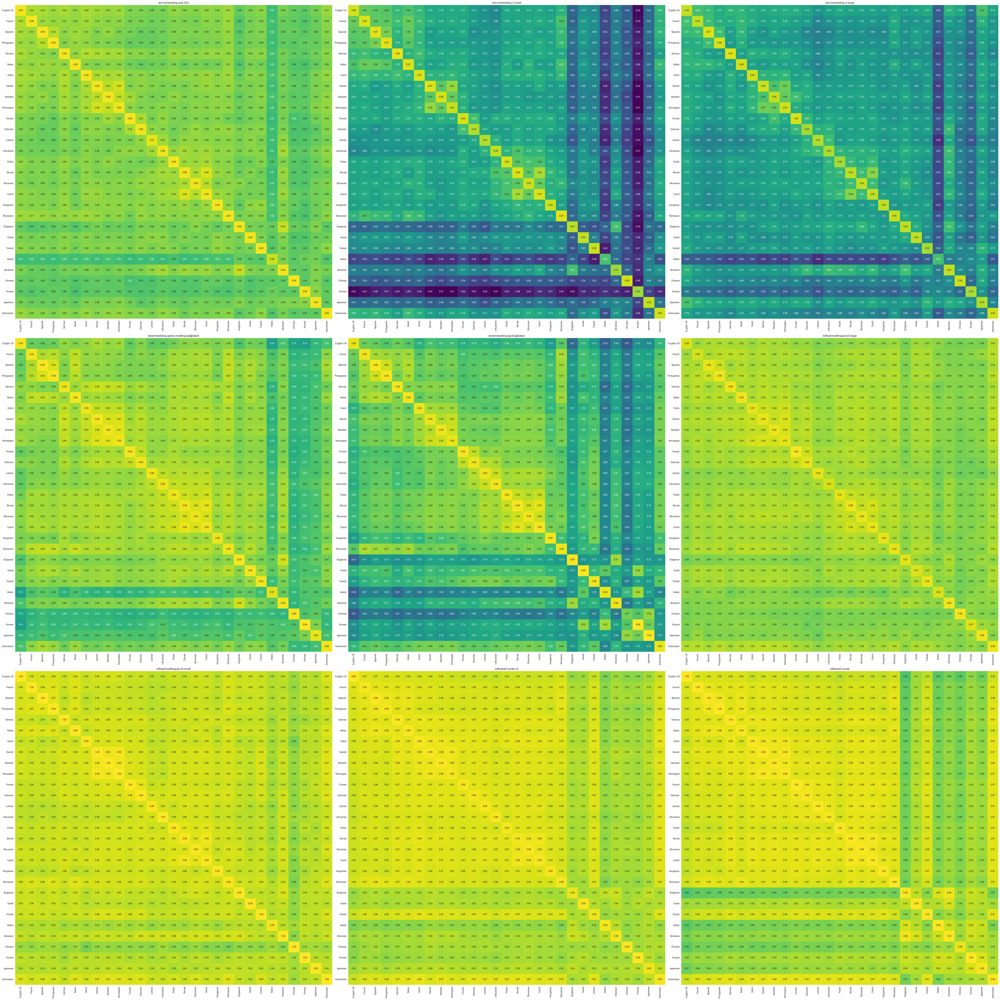

In [3]:
plot_confusion_matrices(rephrased_texts, "plots_embeddings/similarity_rephrased_texts.png")

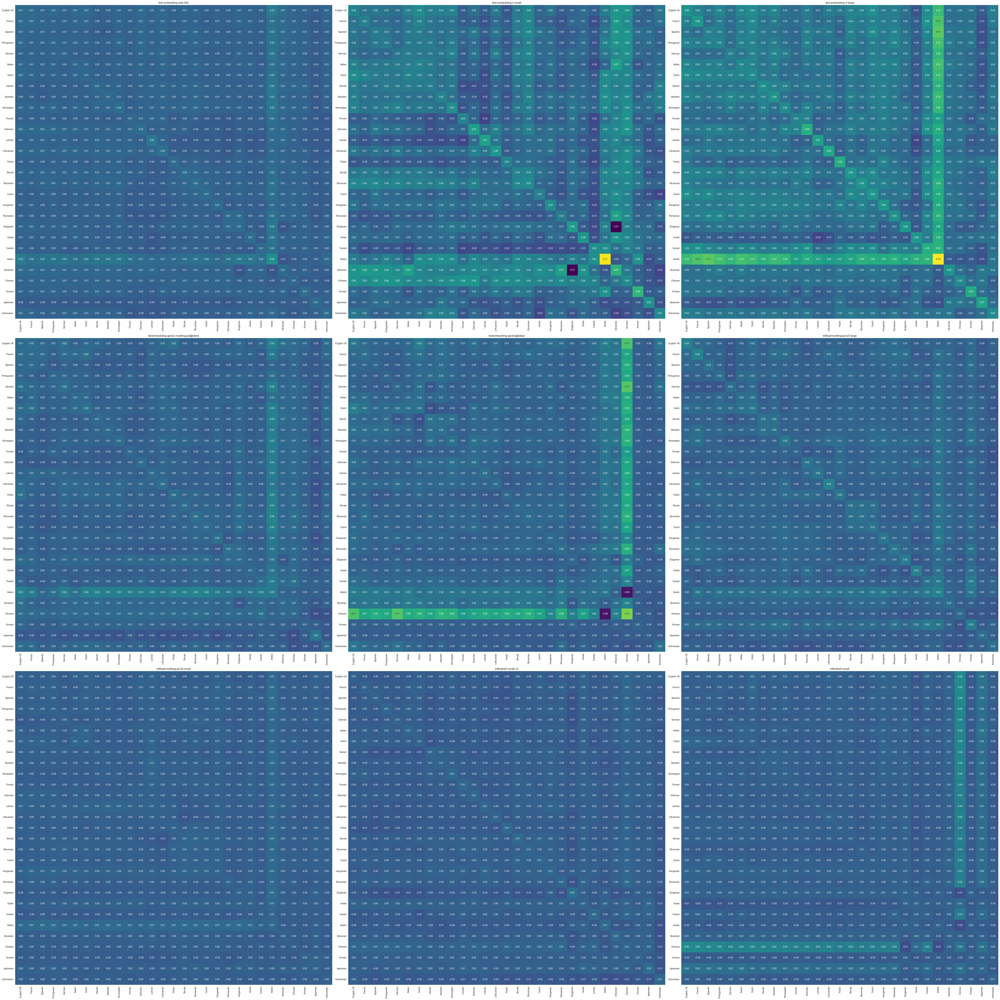

In [4]:
difference_rephrased_text = compute_dict_array_diff(same_texts, rephrased_texts)

plot_confusion_matrices(difference_rephrased_text, "plots_embeddings/difference_to_rephrased_text.png")

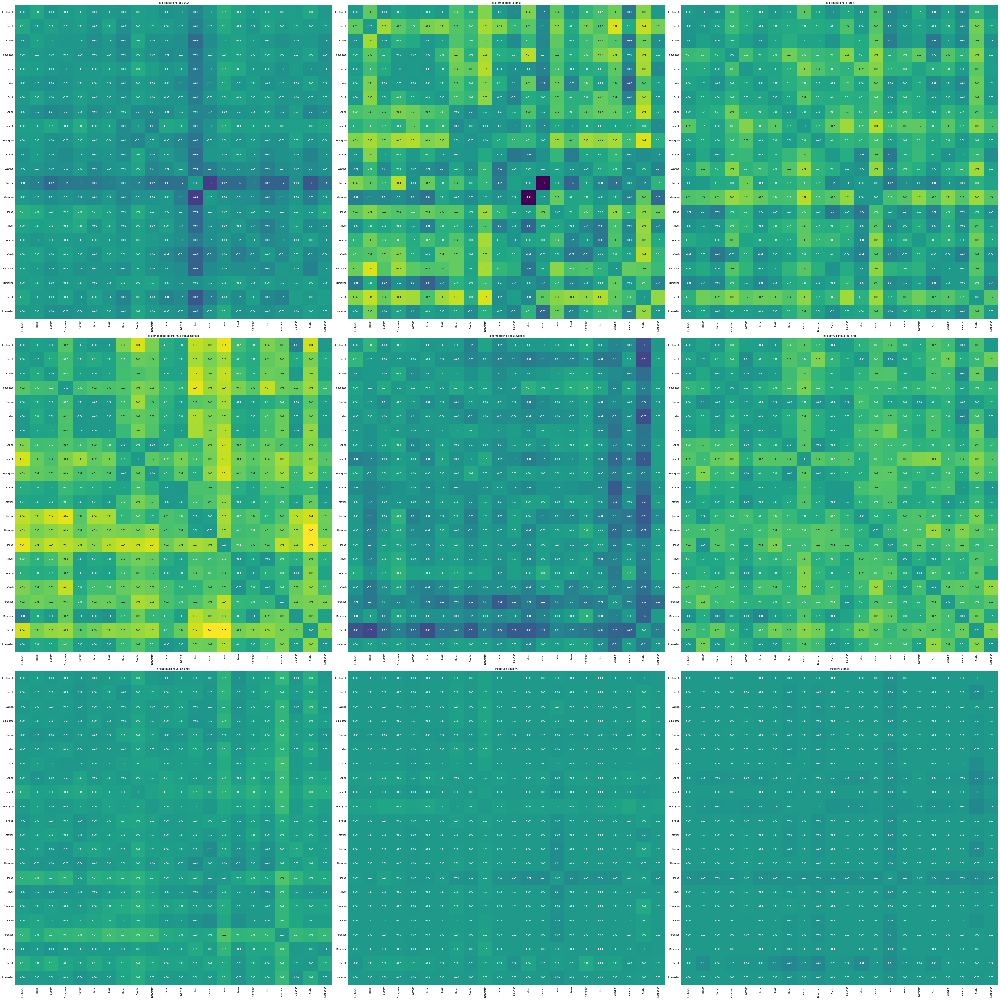

In [5]:
plot_confusion_matrices(
    compute_dict_array_diff(same_texts_only_latin, same_texts_no_special_chars),
    "plots_embeddings/difference_same_text_without_special_chars.png",
    only_latin_langs=True
)

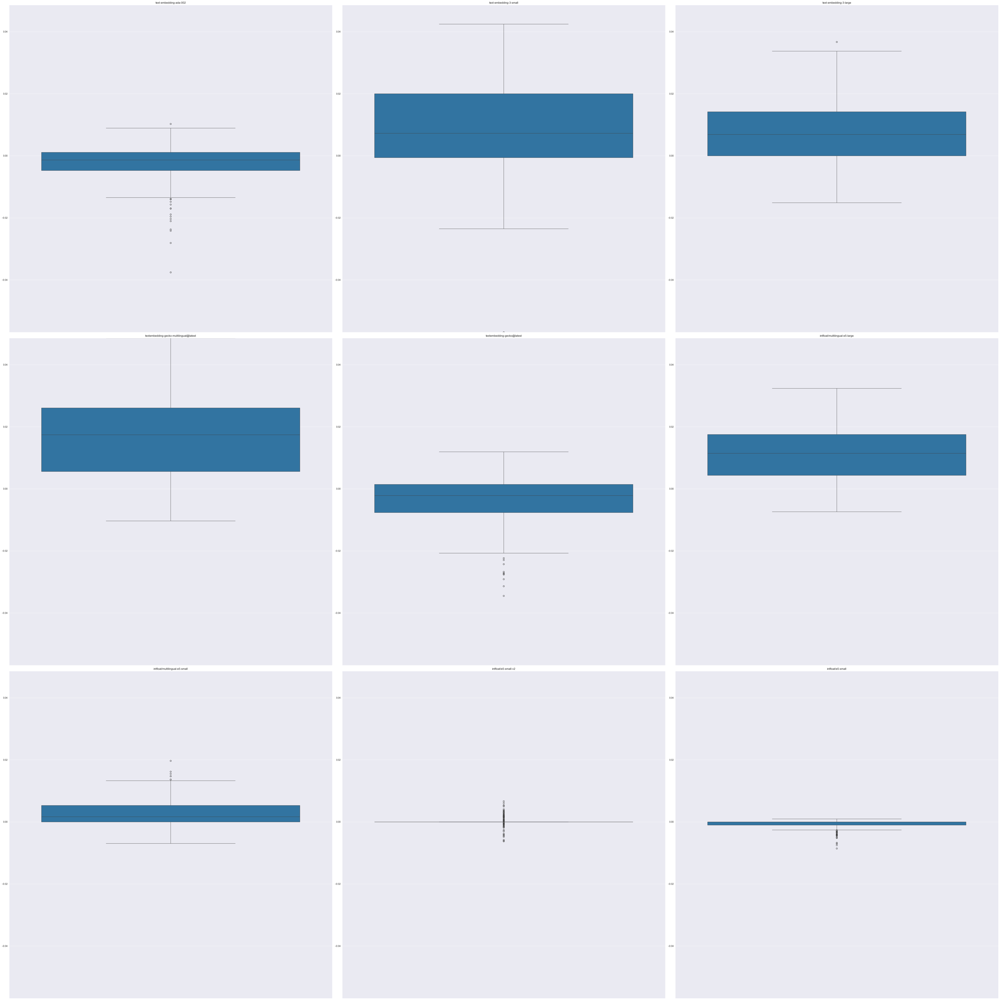

In [6]:
plot_boxplot_for_matrices(
    compute_dict_array_diff(same_texts_only_latin, same_texts_no_special_chars),
    "plots_embeddings/difference_after_special_chars_removed.png"
)